# Generic Nearest Neighborhood Analysis

In [23]:
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors
import time
import sys
import matplotlib.pyplot as plt
import math
import os
from itertools import product

from sklearn.cluster import MiniBatchKMeans
import seaborn as sns
import scanpy as sc

def get_windows(job,n_neighbors):
    start_time,idx,tissue_name,indices = job
    job_start = time.time()
    
    print ("Starting:", str(idx+1)+'/'+str(len(exps)),': ' + exps[idx])

    tissue = tissue_group.get_group(tissue_name)
    to_fit = tissue.loc[indices][[X,Y]].values

    fit = NearestNeighbors(n_neighbors=n_neighbors).fit(tissue[[X,Y]].values)
    m = fit.kneighbors(to_fit)

    #sort_neighbors
    args = m[0].argsort(axis = 1)
    add = np.arange(m[1].shape[0])*m[1].shape[1]
    sorted_indices = m[1].flatten()[args+add[:,None]]

    neighbors = tissue.index.values[sorted_indices]
   
    end_time = time.time()
   
    print ("Finishing:", str(idx+1)+"/"+str(len(exps)),": "+ exps[idx],end_time-job_start,end_time-start_time)
    return neighbors.astype(np.int32)


In [2]:
#Choose this information and input based on above
ks = [5,10,20] # k=5 means it collects 5 nearest neighbors for each center cell
path_to_data = 'G:/21_11_24_Mouse_Temporary/20_11/Processed_and_analyzed/21_24_25_neighborhood_start.csv'

X = 'x'
Y = 'y'
reg = 'unique_region'
file_type = 'csv'

cluster_col = 'cell_type3'
cellhier_path = 'G:/cellhier'
keep_cols = [X,Y,reg,cluster_col]
save_path = 'G:/21_11_24_Mouse_Temporary/20_11/Processed_and_analyzed/'

# Data Preprocessing

##########################

In [3]:
#Import Data
n_neighbors = max(ks)
sys.path.append(cellhier_path)
from cellhier.general import *

cells = pd.read_csv(path_to_data)
cells = pd.concat([cells,pd.get_dummies(cells[cluster_col])],1)
sum_cols = cells[cluster_col].unique()
values = cells[sum_cols].values

C:\Users\akoya-stanford\Anaconda3\envs\UMAP_env\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (0,58,60) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [4]:
#Get each region
tissue_group = cells[[X,Y,reg]].groupby(reg)
exps = list(cells[reg].unique())
tissue_chunks = [(time.time(),exps.index(t),t,a) for t,indices in tissue_group.groups.items() for a in np.array_split(indices,1)] 
tissues = [get_windows(job,n_neighbors) for job in tissue_chunks]

Starting: 1/50 : reg1
Finishing: 1/50 : reg1 0.03690147399902344 0.04089069366455078
Starting: 10/50 : reg10
Finishing: 10/50 : reg10 0.026927947998046875 0.06682109832763672
Starting: 11/50 : reg11
Finishing: 11/50 : reg11 0.019946575164794922 0.08776497840881348
Starting: 12/50 : reg12
Finishing: 12/50 : reg12 0.0029914379119873047 0.09175443649291992
Starting: 13/50 : reg13
Finishing: 13/50 : reg13 0.04388260841369629 0.1356370449066162
Starting: 14/50 : reg14
Finishing: 14/50 : reg14 0.03789925575256348 0.17453360557556152
Starting: 15/50 : reg15
Finishing: 15/50 : reg15 0.038895606994628906 0.21442604064941406
Starting: 16/50 : reg16
Finishing: 16/50 : reg16 0.03291177749633789 0.2483353614807129
Starting: 17/50 : reg17
Finishing: 17/50 : reg17 0.02892303466796875 0.2792530059814453
Starting: 18/50 : reg18
Finishing: 18/50 : reg18 0.026928186416625977 0.3071784973144531
Starting: 19/50 : reg19
Finishing: 19/50 : reg19 0.03889584541320801 0.34607434272766113
Starting: 2/50 : reg2
F

In [5]:
#Loop over k to compute neighborhoods
out_dict = {}
for k in ks:
    for neighbors,job in zip(tissues,tissue_chunks):

        chunk = np.arange(len(neighbors))#indices
        tissue_name = job[2]
        indices = job[3]
        window = values[neighbors[chunk,:k].flatten()].reshape(len(chunk),k,len(sum_cols)).sum(axis = 1)
        out_dict[(tissue_name,k)] = (window.astype(np.float16),indices)
        
windows = {}
for k in ks:
   
    window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
    window = window.loc[cells.index.values]
    window = pd.concat([cells[keep_cols],window],1)
    windows[k] = window

In [6]:
#Fill in based on above
k = 10
n_neighborhoods = 30
neighborhood_name = "neighborhood"+str(k)
k_centroids = {}

In [7]:
#producing what to plot
windows2 = windows[k]
windows2[cluster_col] = cells[cluster_col]

km = MiniBatchKMeans(n_clusters = n_neighborhoods,random_state=0)

labels = km.fit_predict(windows2[sum_cols].values)
k_centroids[k] = km.cluster_centers_
cells[neighborhood_name] = labels

In [8]:
cells.columns

Index(['Unnamed: 0', 'FOXP3', 'CD86', 'CD117', 'Ki67', 'CD19', 'TCF7', 'CD3',
       'CD90', 'CD25', 'CD11b', 'CD5', 'CD11c', 'CD71', 'CD8a', 'H2Db', 'CD44',
       'CD169', 'CD31', 'F480', 'PD1', 'Ly6G', 'H2Kb', 'CD4', 'IgM', 'Ly6C',
       'podoplanin', 'CD27', 'B220', 'PD-L1', 'TCRb', '16and32', 'NKp46',
       'CD45', 'Sca1', 'MHCII', 'keratin8', 'KLRG1', 'IgD', 'cell_id',
       'first_index', 'region', 'tile_num', 'x', 'y', 'date', 'array',
       'region_num', 'CD62L', 'CD69', 'CCR7', 'ICOS', 'Tim3', 'CD79b',
       'leiden', 'new_clusters', 'batch', 'conditions', 'major_clusters',
       'leiden_0.5', 'regions', 'cell_type', 'new_cell_type', 'cell_type2',
       'cell_type3', 'date_reg', 'unique_region', 'APC_MHCII', 'B', 'CD4T',
       'CD4T_KLRG1', 'CD4Treg', 'CD8T', 'CD8T_PD1', 'DC', 'DC_TCF7',
       'Endothelial', 'Epithelial', 'Lymphatic', 'Lymphatic_Ly6C',
       'Macrophage', 'Macrophage_CD169', 'Macrophage_CD86', 'Macrophage_PDL1',
       'NK', 'Neutrophil', 'tumor', '

In [18]:
cells['date_array']=cells['date'].astype(str)+'_'+cells['array'].astype(str)
cells.date_array.unique()

array(['201124_TNTtumors1', '201124_TNTtumors2', '201125_TNTtumors1',
       '201125_TNTtumors2', '201121_TNTtumors1', '201121_TNTtumors2'],
      dtype=object)

In [20]:
cells.region.max()

13.0

In [26]:
def xycorr(df, sample_col, y_rows, x_columns, X_pix, Y_pix):
    
    #Make a copy for xy correction
    df_XYcorr = df.copy()
    
    df_XYcorr["Xcorr"] = 0
    df_XYcorr["Ycorr"] = 0
    
    for sample in df_XYcorr[sample_col].unique():
        df_sub = df_XYcorr.loc[df_XYcorr[sample_col]==sample]
        region_num = df_sub.region.max().astype(int)

        #first value of tuple is y and second is x
        d = list(product(range(0,y_rows,1),range(0,x_columns,1)))
        e = list(range(1,region_num+1,1))
        dict_corr = {}
        dict_corr = dict(zip(e, d)) 

        #Adding the pixels with the dictionary
        for x in range(1,region_num+1,1):
            df_XYcorr["Xcorr"].loc[(df_XYcorr["region"]== x)&(df_XYcorr[sample_col]==sample)] = df_XYcorr['x'].loc[(df_XYcorr['region']==x)&(df_XYcorr[sample_col]==sample)] +dict_corr[x][1]*X_pix

        for x in range(1,region_num+1,1):
            df_XYcorr["Ycorr"].loc[(df_XYcorr["region"]== x)&(df_XYcorr[sample_col]==sample)] = df_XYcorr['y'].loc[(df_XYcorr['region']==x)&(df_XYcorr[sample_col]==sample)] +dict_corr[x][0]*Y_pix

    return df_XYcorr

In [27]:
cells = xycorr(df=cells,sample_col='date_array', y_rows=4, x_columns=4, X_pix=4032, Y_pix=3024)

C:\Users\akoya-stanford\Anaconda3\envs\UMAP_env\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
C:\Users\akoya-stanford\Anaconda3\envs\UMAP_env\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
C:\Users\akoya-stanford\Anaconda3\envs\UMAP_env\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-

201124_TNTtumors1


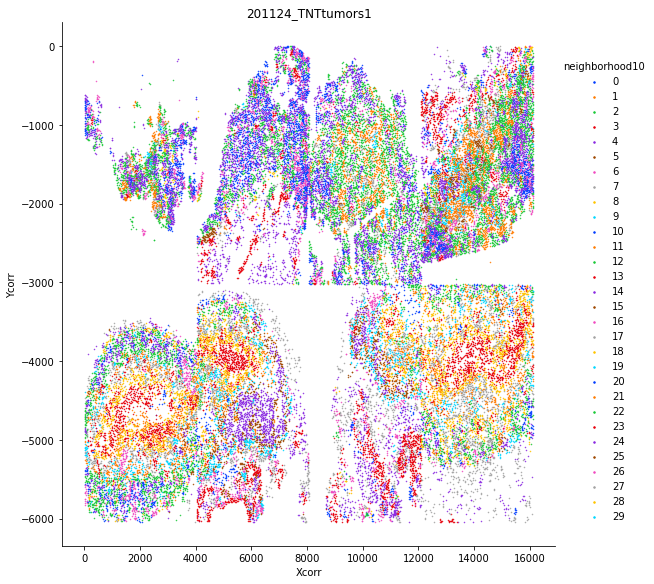

201124_TNTtumors2


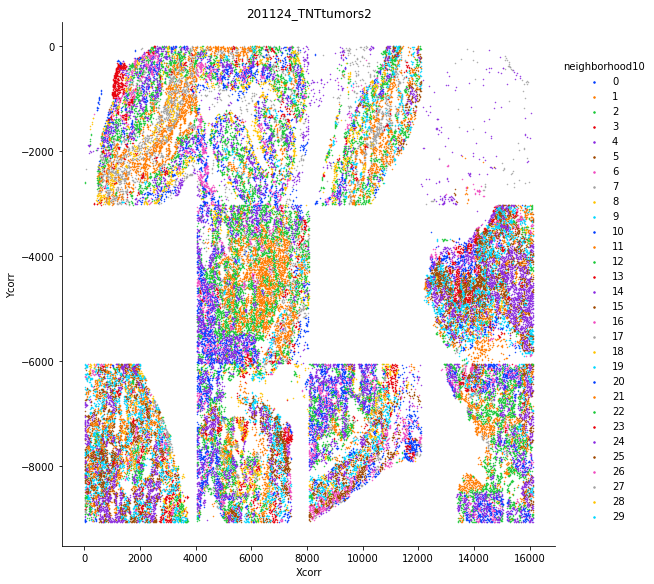

201125_TNTtumors1


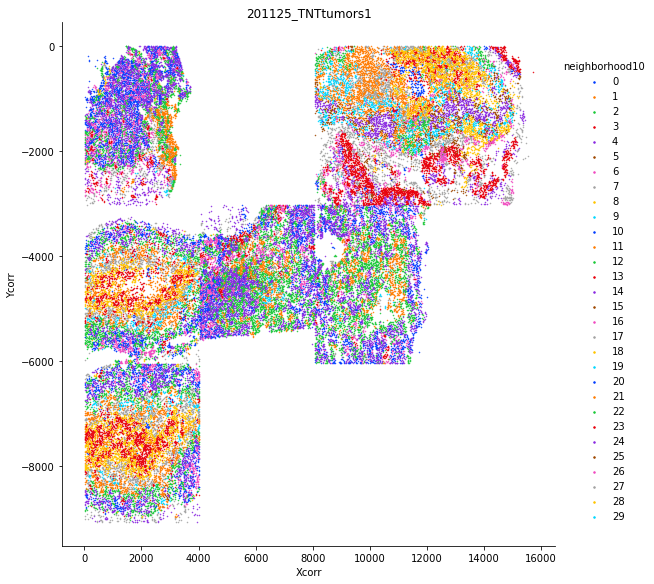

201125_TNTtumors2


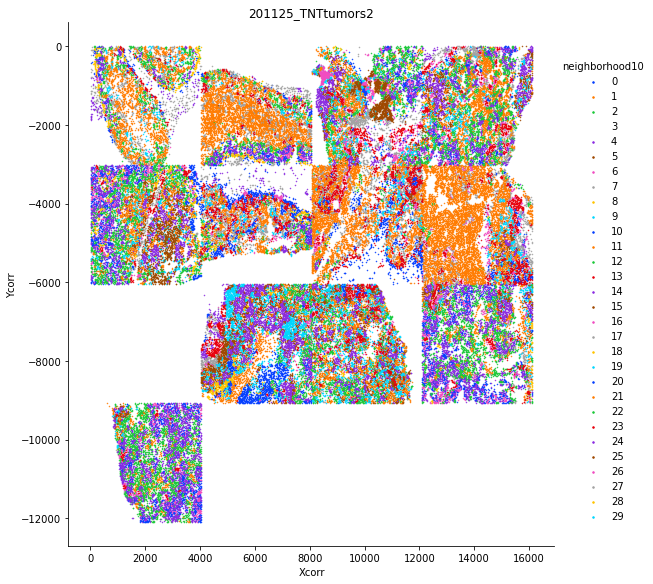

201121_TNTtumors1


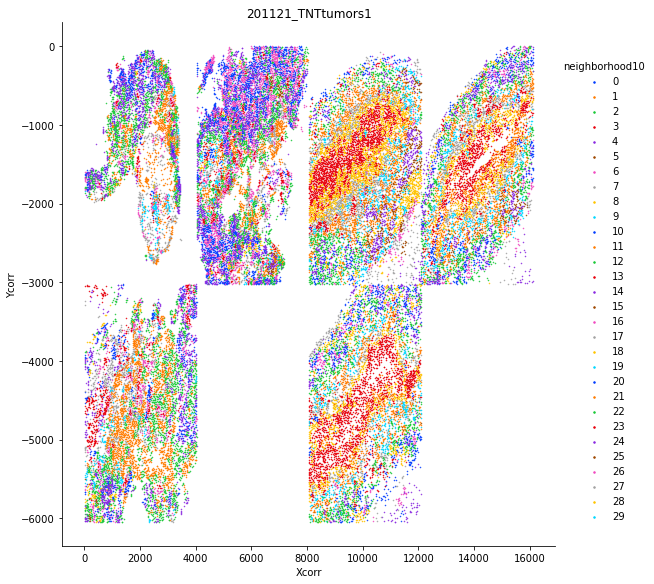

201121_TNTtumors2


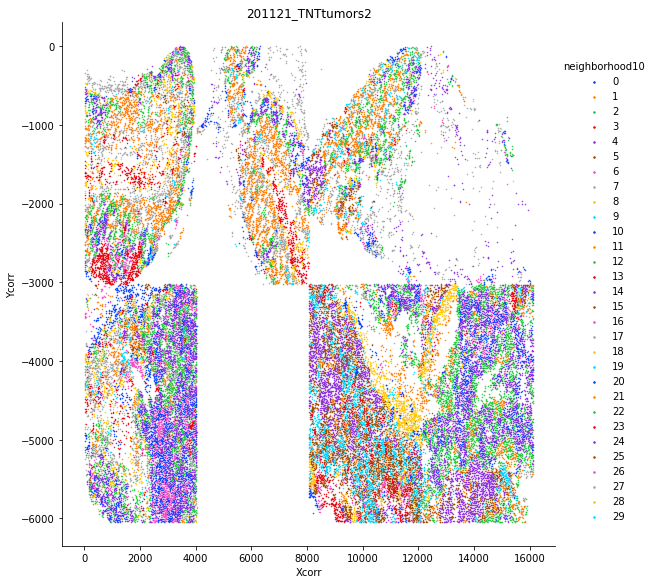

In [29]:
#modify figure size aesthetics for each neighborhood
plt.rcParams["legend.markerscale"] = 3
figs = catplot(cells,X = 'Xcorr',Y='Ycorr', exp= 'date_array',
               hue = 'neighborhood'+str(k),invert_y=True,size = 1,figsize=8)

201124_TNTtumors1


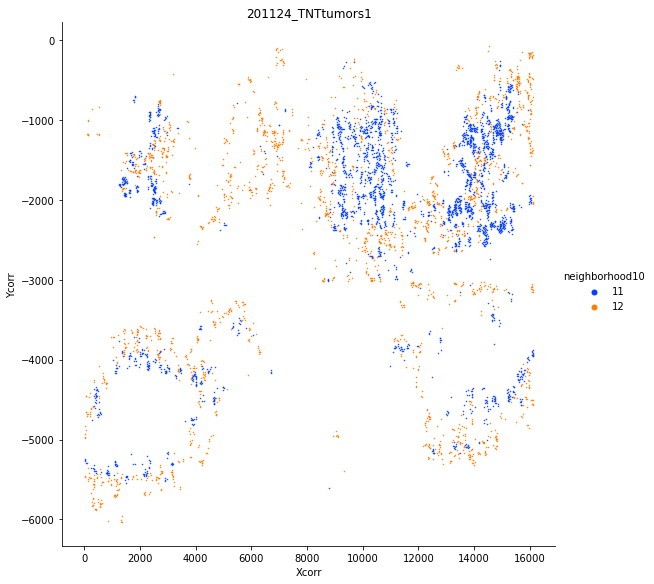

201124_TNTtumors2


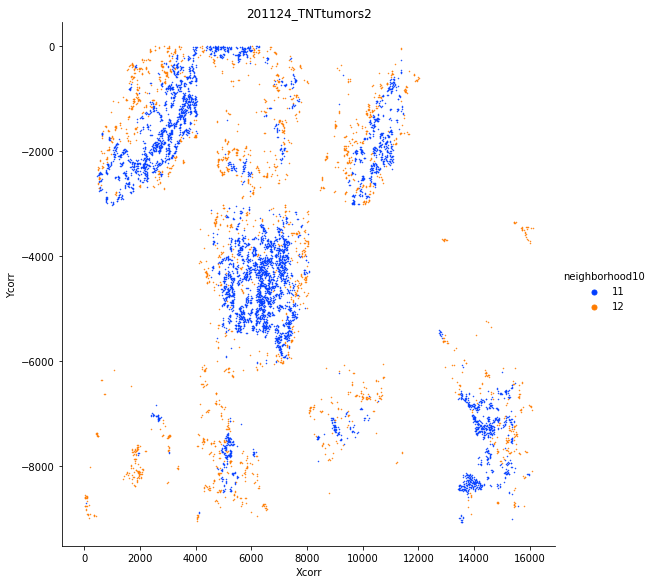

201125_TNTtumors1


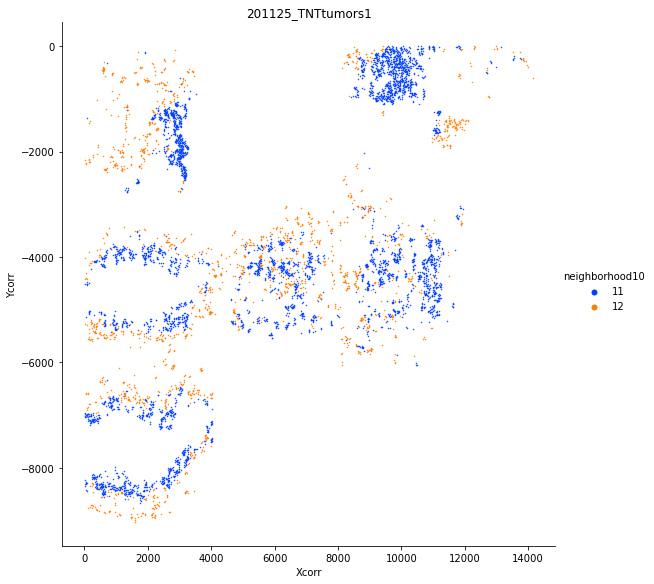

201125_TNTtumors2


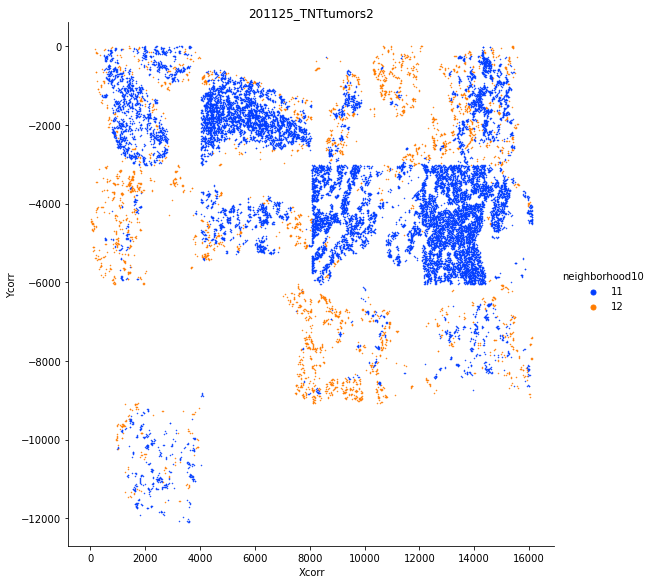

201121_TNTtumors1


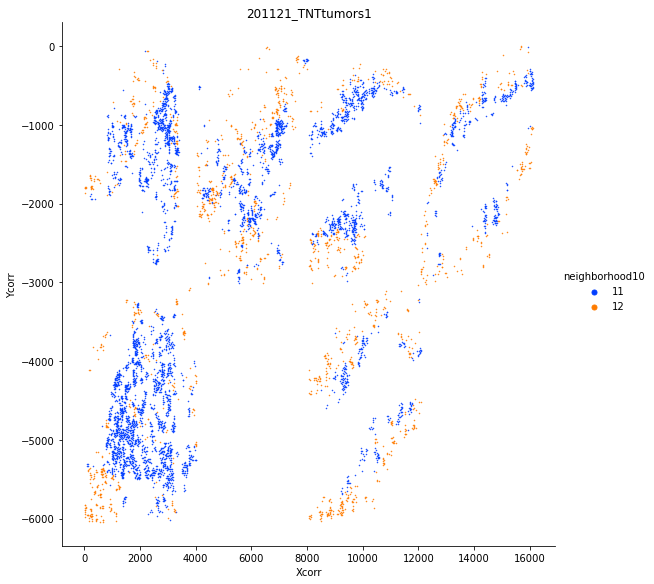

201121_TNTtumors2


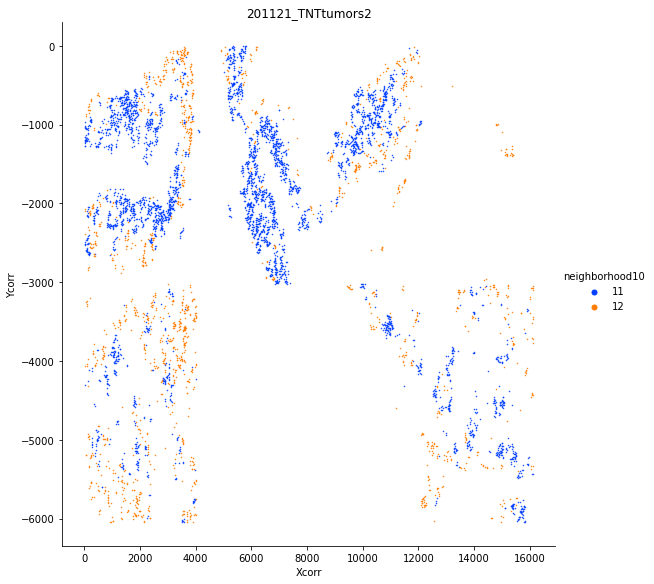

In [54]:
#modify figure size aesthetics for each neighborhood
plt.rcParams["legend.markerscale"] = 10
figs = catplot(cells.loc[cells.neighborhood10.isin([11,12])],X = 'Xcorr',Y='Ycorr', exp= 'date_array',
               hue = 'neighborhood'+str(k),invert_y=True,size = 1,figsize=8)

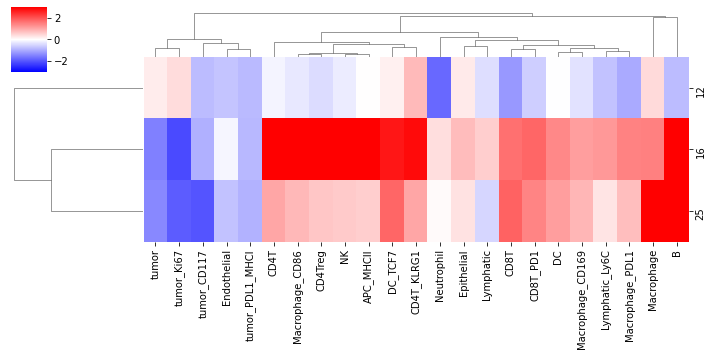

In [52]:
#this plot shows the types of cells (ClusterIDs) in the different niches (0-9)
k_to_plot = k
niche_clusters = (k_centroids[k_to_plot])
tissue_avgs = values.mean(axis = 0)
fc = np.log2(((niche_clusters+tissue_avgs)/(niche_clusters+tissue_avgs).sum(axis = 1, keepdims = True))/tissue_avgs)
fc = pd.DataFrame(fc,columns = sum_cols)
s=sns.clustermap(fc.iloc[[16,25,12],:], vmin =-3,vmax = 3,cmap = 'bwr',figsize=(10,5))
#s.savefig(save_path+"celltypes_perniche_"+"_"+str(k)+".png", dpi=600)

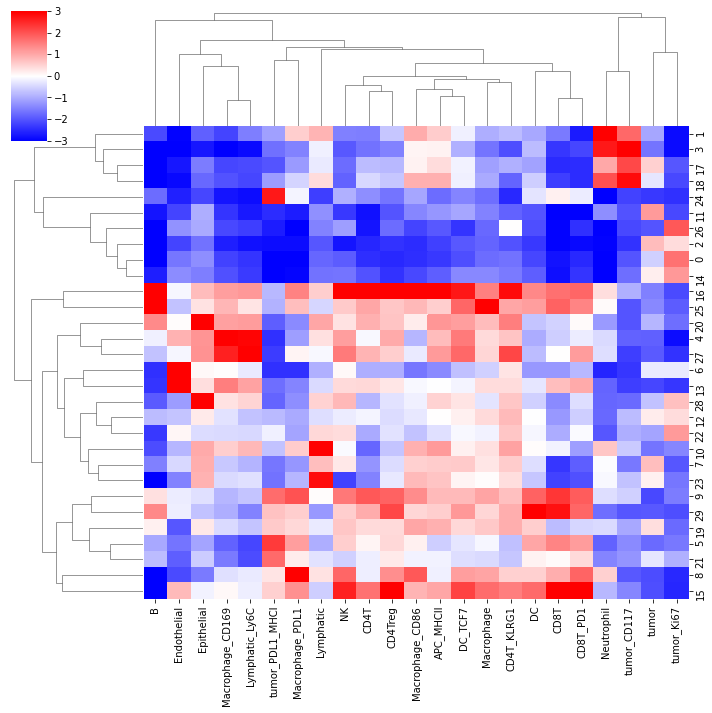

In [30]:
#this plot shows the types of cells (ClusterIDs) in the different niches (0-9)
k_to_plot = k
niche_clusters = (k_centroids[k_to_plot])
tissue_avgs = values.mean(axis = 0)
fc = np.log2(((niche_clusters+tissue_avgs)/(niche_clusters+tissue_avgs).sum(axis = 1, keepdims = True))/tissue_avgs)
fc = pd.DataFrame(fc,columns = sum_cols)
s=sns.clustermap(fc, vmin =-3,vmax = 3,cmap = 'bwr', figsize=(10,10))
#s.savefig(save_path+"celltypes_perniche_"+"_"+str(k)+".png", dpi=600)

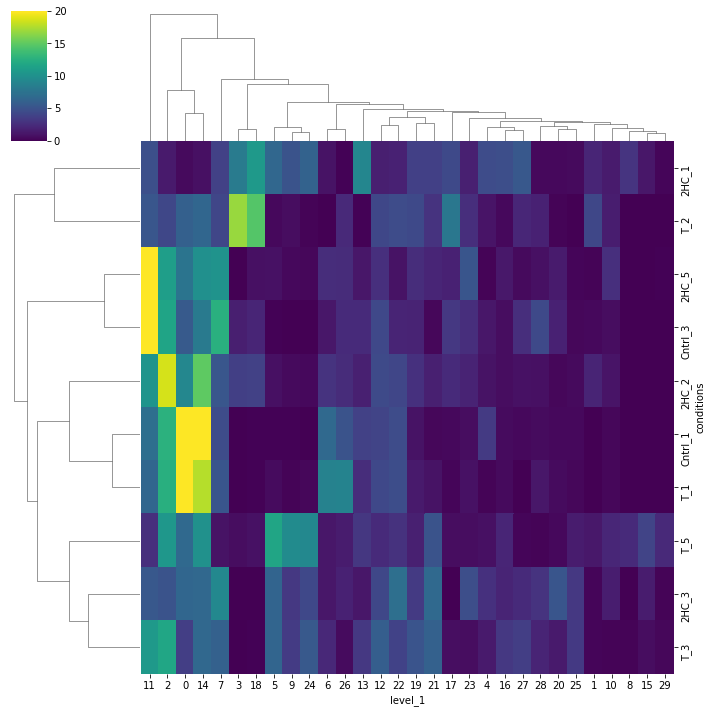

In [56]:
#leiden per sample
per_cell = cells.groupby(["conditions"]).apply(lambda x: x['neighborhood10'].value_counts(normalize = True,sort = False)*100).to_frame().reset_index()
bb = per_cell.pivot(index='conditions',columns='level_1',values='neighborhood10').fillna(0)
sns.clustermap(bb, cmap="viridis", vmax=20)

201124_TNTtumors1


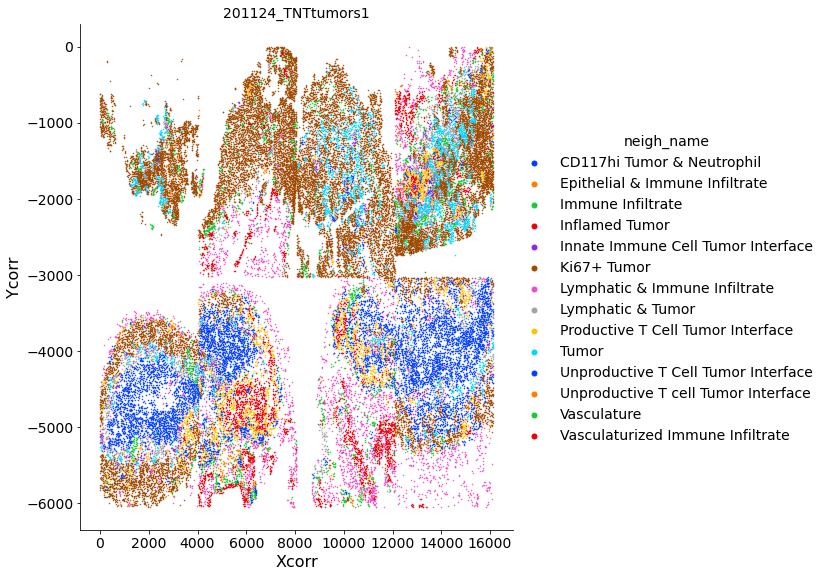

201124_TNTtumors2


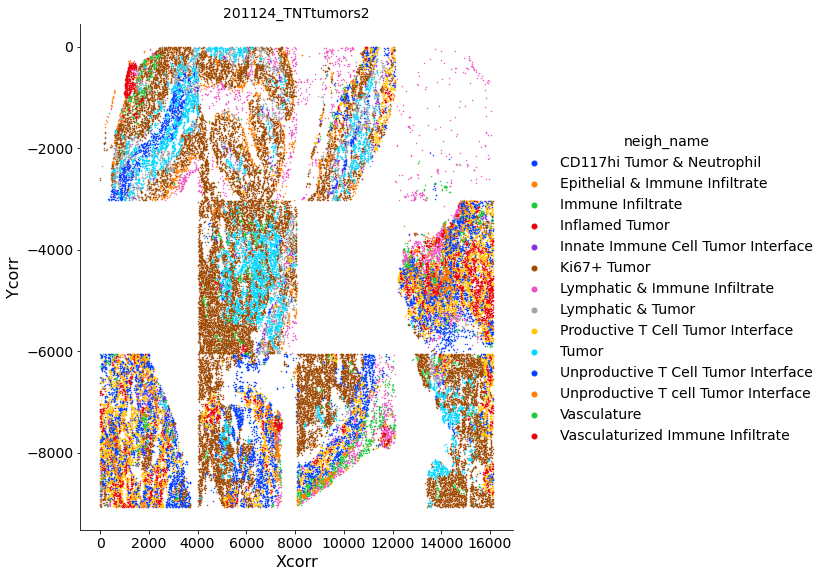

201125_TNTtumors1


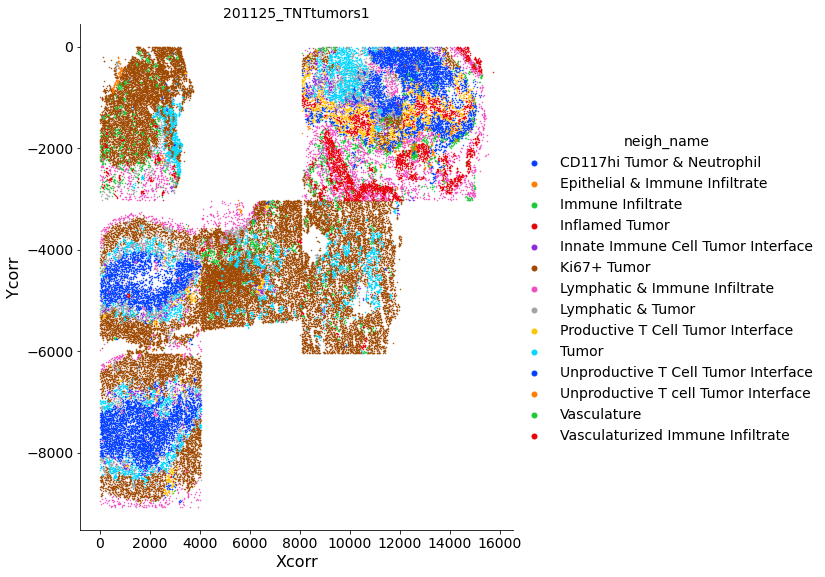

201125_TNTtumors2


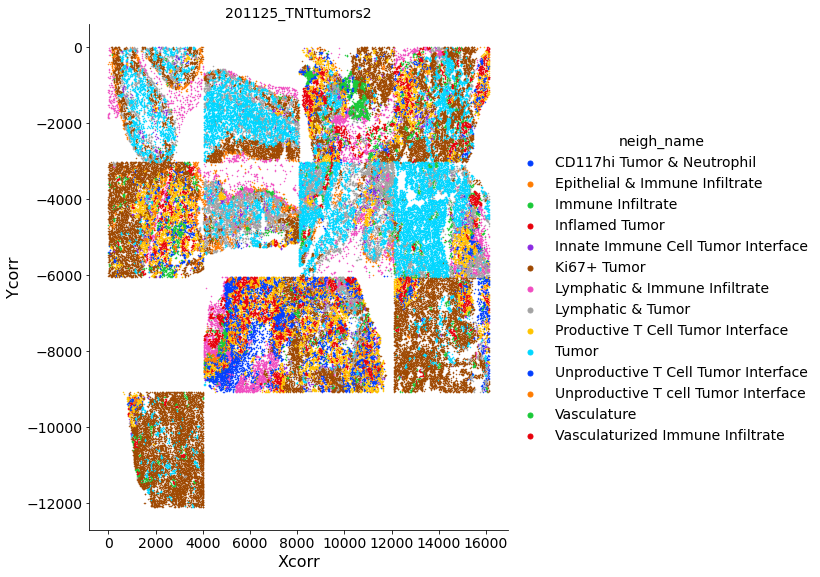

201121_TNTtumors1


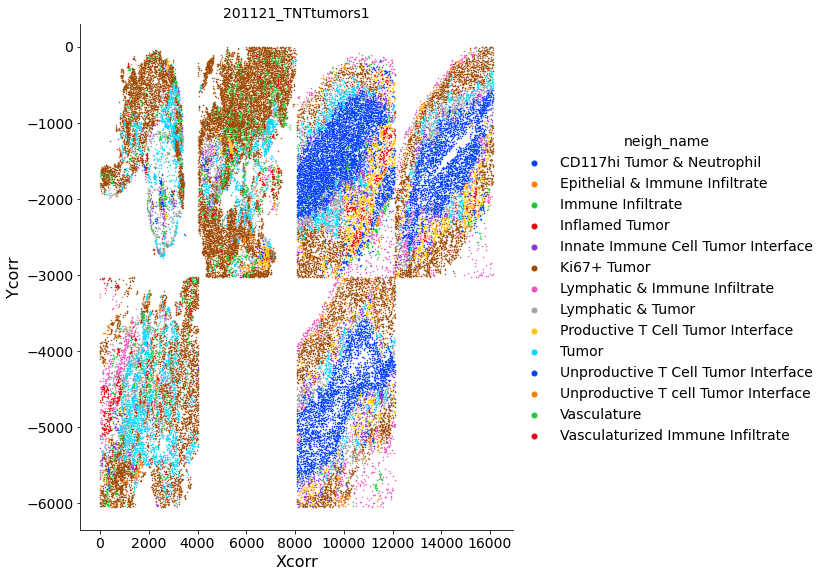

201121_TNTtumors2


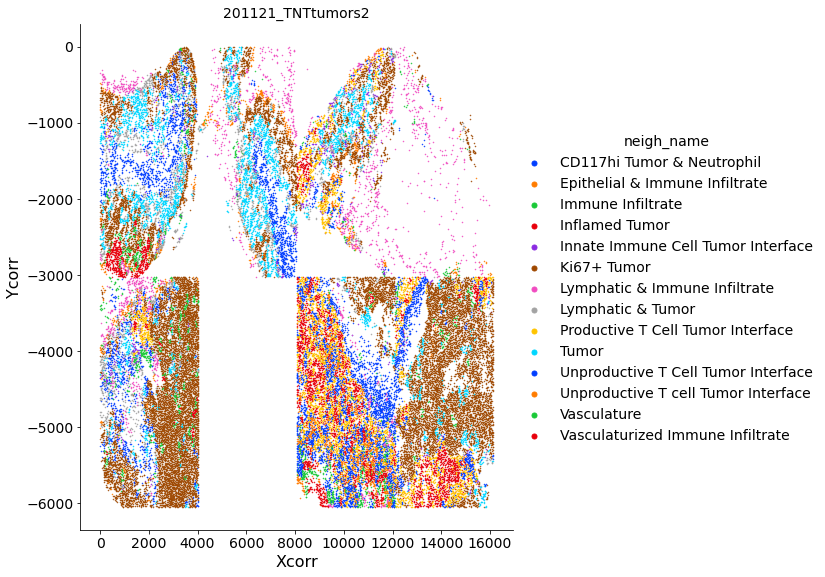

In [76]:
n_conversion_30 = {
    0: 'Ki67+ Tumor',
    1: 'CD117hi Tumor & Neutrophil',
    2: 'Ki67+ Tumor',
    3: 'CD117hi Tumor & Neutrophil',
    4: 'Lymphatic & Immune Infiltrate',
    5: 'Productive T Cell Tumor Interface',
    6: 'Vasculature',
    7: 'Lymphatic & Tumor',
    8: 'Unproductive T Cell Tumor Interface',
    9: 'Unproductive T Cell Tumor Interface',
   
    10: 'Lymphatic & Immune Infiltrate',
    11: 'Tumor',
    12: 'Ki67+ Tumor',
    13: 'Vasculaturized Immune Infiltrate',
    14: 'Ki67+ Tumor',
    15: 'Unproductive T cell Tumor Interface',
    16: 'Immune Infiltrate',
    17: 'CD117hi Tumor & Neutrophil',
    18: 'CD117hi Tumor & Neutrophil',
    19: 'Innate Immune Cell Tumor Interface',
    
    20: 'Epithelial & Immune Infiltrate',
    21: 'Productive T Cell Tumor Interface',
    22: 'Ki67+ Tumor',
    23: 'Lymphatic & Tumor',
    24: 'Inflamed Tumor',
    25: 'Immune Infiltrate',
    26: 'Ki67+ Tumor',
    27: 'Lymphatic & Immune Infiltrate',
    28: 'Epithelial & Immune Infiltrate',
    29: 'Unproductive T Cell Tumor Interface',

}
cells['neigh_name']=cells['neighborhood10'].map(n_conversion_30)
#modify figure size aesthetics for each neighborhood
plt.rcParams["legend.markerscale"] = 10
figs = catplot(cells,X = 'Xcorr',Y='Ycorr', exp= 'date_array',
               hue = 'neigh_name',invert_y=True,size = 1,figsize=8)

In [60]:
cells.neigh_name.unique()

array(['Ki67+ Tumor', 'Vasculature', 'Innate Immune & Tumor Interface',
       'Tumor', 'Lymphatic & Tumor',
       'Unproductive T cell Tumor Interface',
       'Epithelial & Immune Infiltrate',
       'Vasculaturized Immune Infiltrate', 'Immune Infiltrate',
       'Lymphatic & Immune Infiltrate', 'CD117hi Tumor & Neutrophil',
       'Productive T cell Tumor Interface', 'Inflamed Tumor'],
      dtype=object)

In [61]:
len(cells.neigh_name.unique())

13

In [62]:
pal_color = {
'CD44hi Tumor': 'tan',
 'Tumor': 'gray',
 'Ki67+ Tumor': 'beige',
 'Ki67+ TYRP1hi Tumor': 'brown',
 'Ki67+ CD71hi Tumor': 'orange',
 'APC Enriched Tumor': 'green',
 'Inflamed Tumor': 'magenta',
 'Vascularized Immune Infiltrate': 'black',
 'Unproductive T cell Tumor Interface': 'red',
 'Immune Infiltrate': 'skyblue',
 'TYRP1hi Tumor': 'olive',
 'Productive T cell Tumor Interface': 'blue',
 'Neutrophil Enriched Immune Infiltrate': 'yellow',
 'Neutrophil Enriched': 'gold'
}

pal_color_cells = {
  'EGFR+ Epithelial cell':'blue',
 'Smooth muscle cell':'red',
 'Epithelial cell':'yellow',
  'Nerve cell':'magenta',
  'Macrophage':'orange',  
    'CD4+ Treg':'green',
    'Endothelial cell':'brown', 
     'CD8+ T cell':'black',
 'Intestinal Epithelial cell':'gray',
  'Neutrophil':'skyblue',
 'Parietal cell':'fuchsia',
   'Plasma cell':'gold',  
     'NK cell':'plum',
   'CD4+ T cell':'yellowgreen',
   'CK7+ Epithelial cell':'tan',
   'Neck cell':'navy',
  'Neuroendocrine cell':'bisque',   
 'Chief cell':'goldenrod',
  'Goblet cell':'blueviolet',
  'Foveolar cell':'darkorange',   
 'Stromal cell':'teal',
 'PDPN+ Stromal cell':'olive',
 'p63+ EGFR+ Epithelial cell':'dimgray',
 'Gastric mucouse secreting cell':'indigo',
 'Biglycan+ Stromal cell':'lightcoral',
 'Dendritic cell':'cyan',
 'Paneth cell':'ivory',
 'B cell':'beige',
 'Squamous Epithelial cell':'darkblue',
 'Immune unknown cell':'lightcyan',
 'p63+ Epithelial cell':'royalblue',
}

In [70]:
cell_list = list(cells.cell_type3.unique())
neigh_list = list(cells.neigh_name.unique())
color_list=list(pal_color_cells.values())
dict_cell = dict(zip(cell_list, color_list))
dict_neigh = dict(zip(neigh_list, color_list))
dict_neigh

{'Ki67+ Tumor': 'blue',
 'Vasculature': 'red',
 'Innate Immune & Tumor Interface': 'yellow',
 'Tumor': 'magenta',
 'Lymphatic & Tumor': 'orange',
 'Unproductive T cell Tumor Interface': 'green',
 'Epithelial & Immune Infiltrate': 'brown',
 'Vasculaturized Immune Infiltrate': 'black',
 'Immune Infiltrate': 'gray',
 'Lymphatic & Immune Infiltrate': 'skyblue',
 'CD117hi Tumor & Neutrophil': 'fuchsia',
 'Productive T cell Tumor Interface': 'gold',
 'Inflamed Tumor': 'plum'}

In [71]:
dict_cell

{'tumor': 'blue',
 'Macrophage_CD86': 'red',
 'tumor_Ki67': 'yellow',
 'DC': 'magenta',
 'Macrophage': 'orange',
 'Endothelial': 'green',
 'NK': 'brown',
 'APC_MHCII': 'black',
 'DC_TCF7': 'gray',
 'Macrophage_CD169': 'skyblue',
 'Neutrophil': 'fuchsia',
 'CD4T': 'gold',
 'Epithelial': 'plum',
 'tumor_CD117': 'yellowgreen',
 'Lymphatic_Ly6C': 'tan',
 'CD8T': 'navy',
 'Lymphatic': 'bisque',
 'CD4T_KLRG1': 'goldenrod',
 'tumor_PDL1_MHCI': 'blueviolet',
 'Macrophage_PDL1': 'darkorange',
 'CD4Treg': 'teal',
 'CD8T_PD1': 'olive',
 'B': 'dimgray'}

201124_TNTtumors1


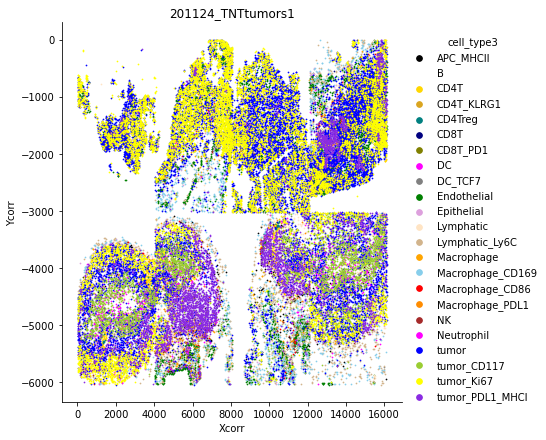

201124_TNTtumors2


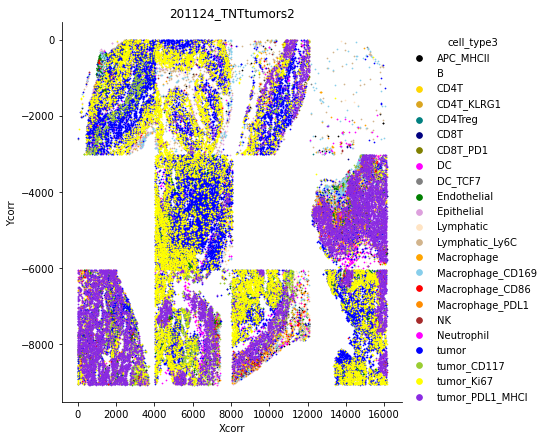

201125_TNTtumors1


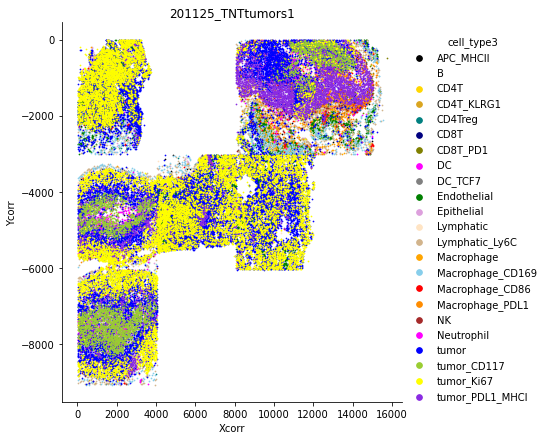

201125_TNTtumors2


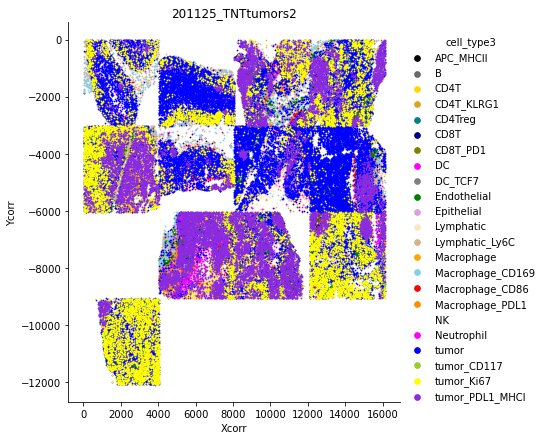

201121_TNTtumors1


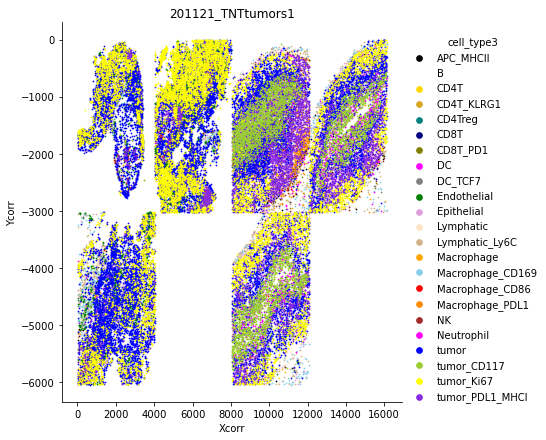

201121_TNTtumors2


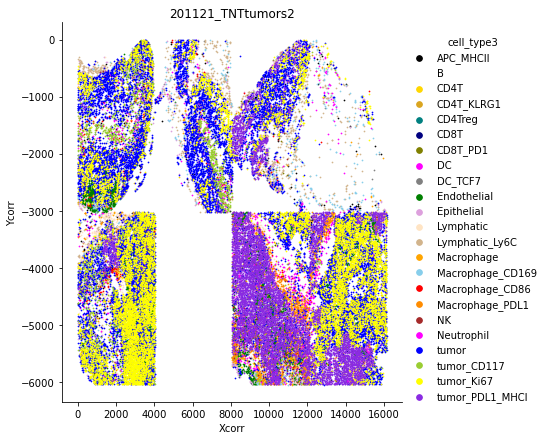

In [72]:
#modify figure size aesthetics for each neighborhood
plt.rcParams["legend.markerscale"] = 8
figs_c = catplot(cells,X = 'Xcorr',Y='Ycorr', exp= 'date_array',
               hue = 'cell_type3',invert_y=True,size = 2,figsize=6,palette=dict_cell)

201124_TNTtumors1


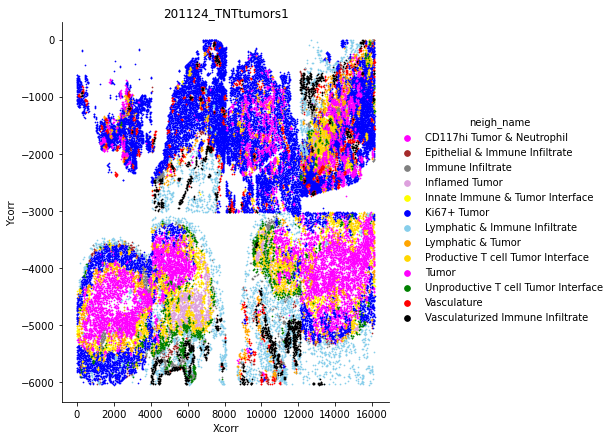

201124_TNTtumors2


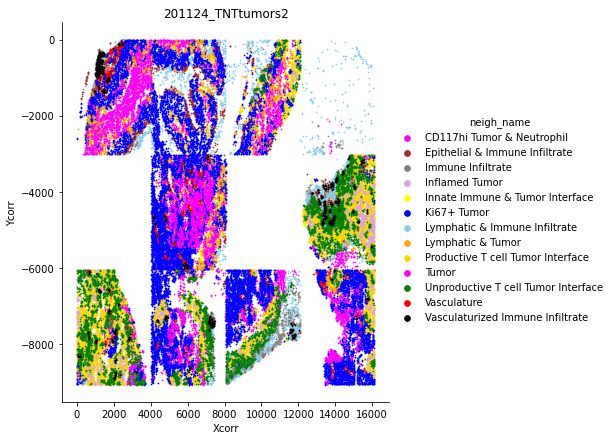

201125_TNTtumors1


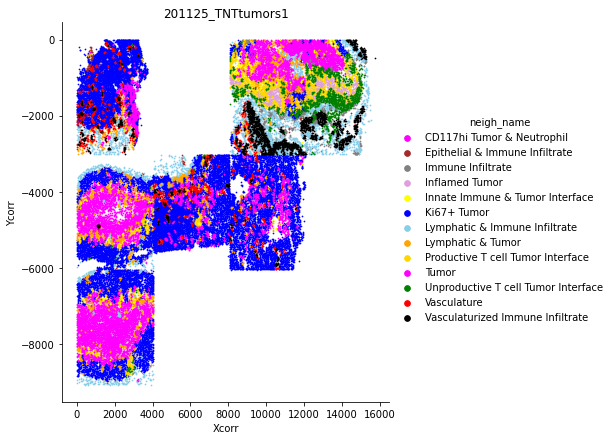

201125_TNTtumors2


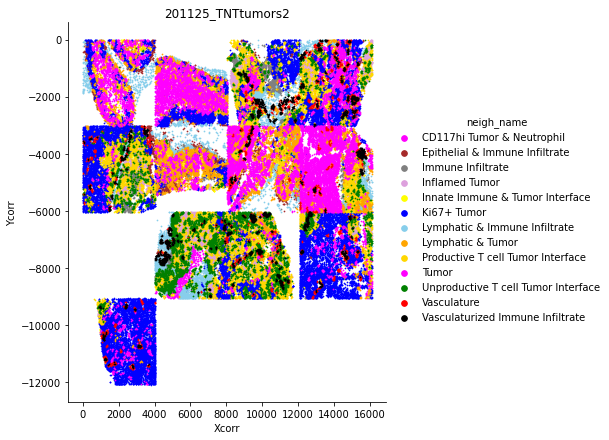

201121_TNTtumors1


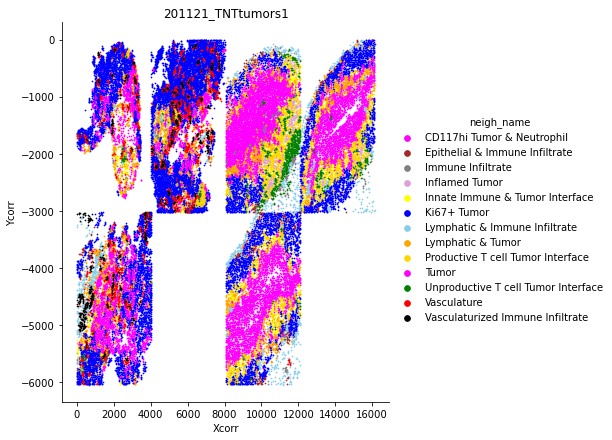

201121_TNTtumors2


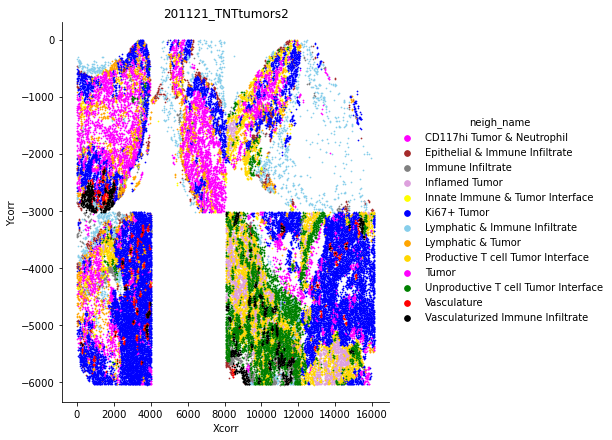

In [65]:
#modify figure size aesthetics for each neighborhood
figs_c = catplot(cells,X = 'Xcorr',Y='Ycorr', exp= 'date_array',
               hue = 'neigh_name',invert_y=True,size = 2,figsize=6,palette=dict_neigh)

In [82]:
list(cell_f.cell_type3.unique())

['tumor',
 'Macrophage_CD86',
 'tumor_Ki67',
 'DC',
 'Macrophage',
 'Endothelial',
 'NK',
 'APC_MHCII',
 'DC_TCF7',
 'Macrophage_CD169',
 'Neutrophil',
 'CD4T',
 'Epithelial',
 'tumor_CD117',
 'Lymphatic_Ly6C',
 'CD8T',
 'Lymphatic',
 'CD4T_KLRG1',
 'tumor_PDL1_MHCI',
 'Macrophage_PDL1',
 'CD4Treg',
 'CD8T_PD1',
 'B']

201124_TNTtumors1


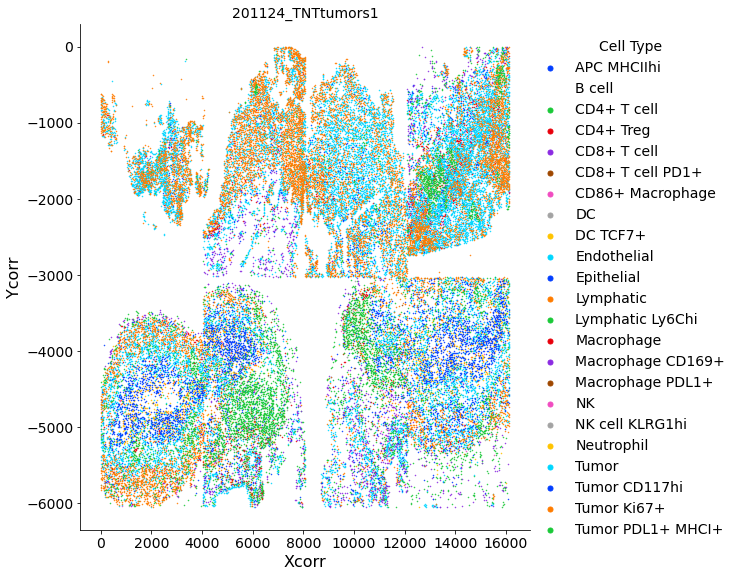

201124_TNTtumors2


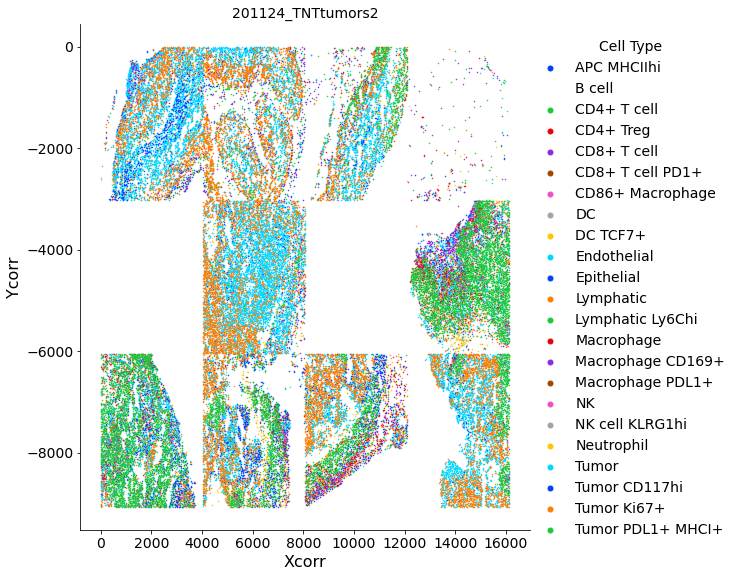

201125_TNTtumors1


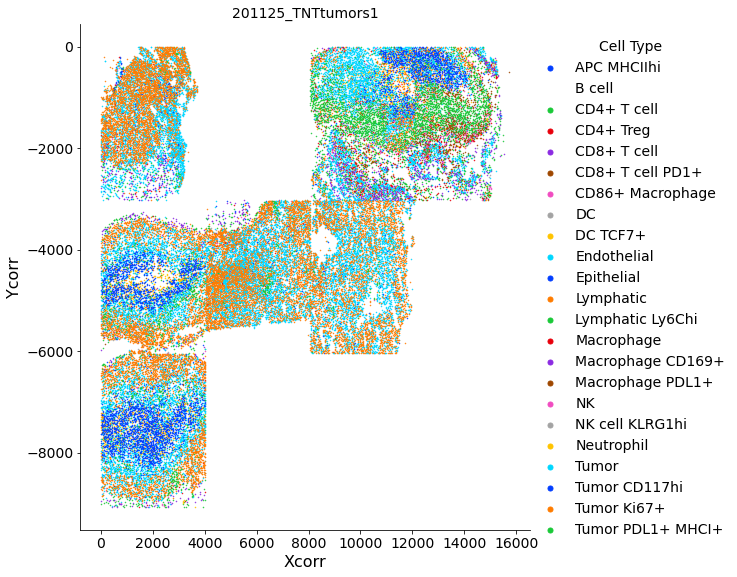

201125_TNTtumors2


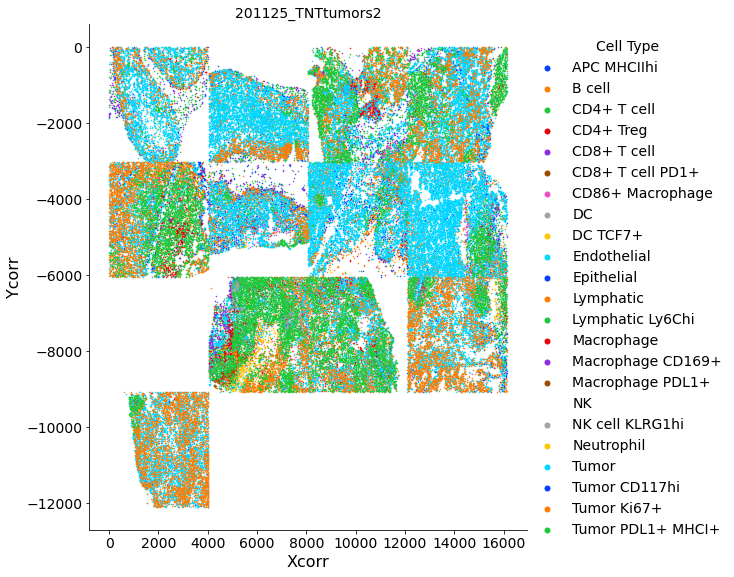

201121_TNTtumors1


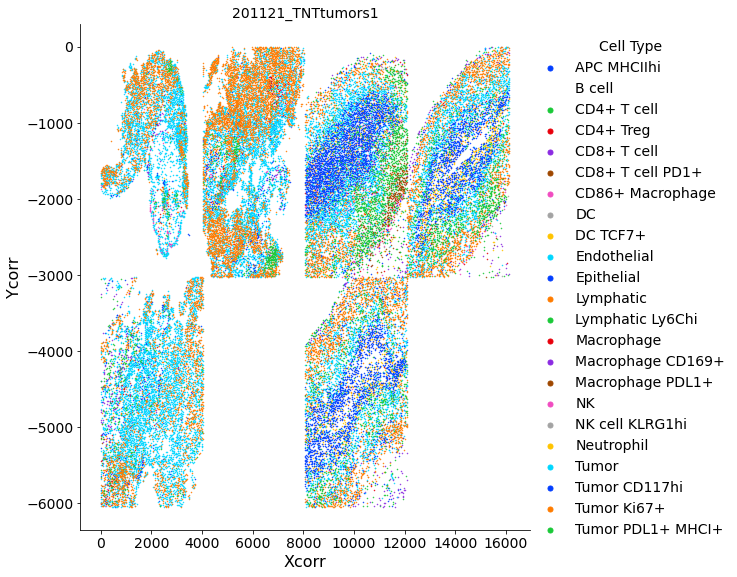

201121_TNTtumors2


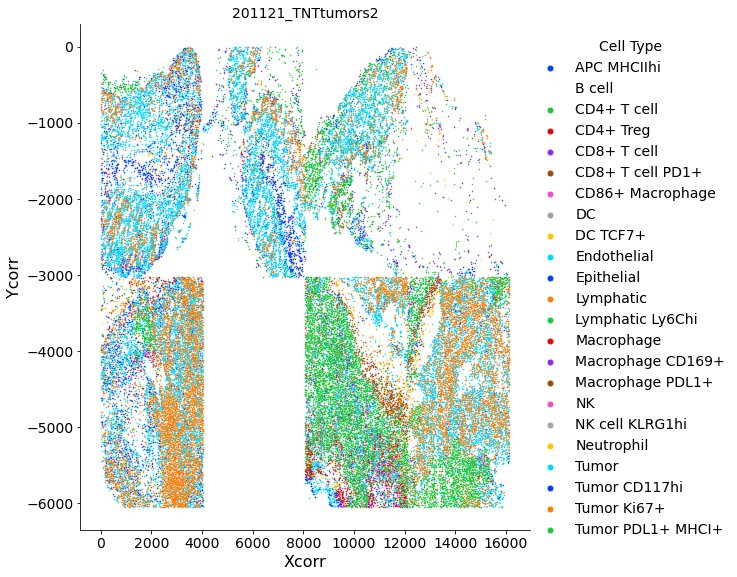

In [83]:
n_conversion_cell = {
 'tumor':'Tumor',
 'Macrophage_CD86':'CD86+ Macrophage',
 'tumor_Ki67':'Tumor Ki67+',
 'DC':'DC',
 'Macrophage':'Macrophage',
 'Endothelial':'Endothelial',
 'NK':'NK',
 'APC_MHCII':'APC MHCIIhi',
 'DC_TCF7':'DC TCF7+',
 'Macrophage_CD169':'Macrophage CD169+',
 'Neutrophil':'Neutrophil',
 'CD4T':'CD4+ T cell',
 'Epithelial':'Epithelial',
 'tumor_CD117':'Tumor CD117hi',
 'Lymphatic_Ly6C': 'Lymphatic Ly6Chi',
 'CD8T':'CD8+ T cell',
 'Lymphatic':'Lymphatic',
 'CD4T_KLRG1':'NK cell KLRG1hi',
 'tumor_PDL1_MHCI':'Tumor PDL1+ MHCI+',
 'Macrophage_PDL1':'Macrophage PDL1+',
 'CD4Treg':'CD4+ Treg',
 'CD8T_PD1':'CD8+ T cell PD1+',
 'B':'B cell',
}
cells['Cell Type']=cells['cell_type3'].map(n_conversion_cell)
#modify figure size aesthetics for each neighborhood
plt.rcParams["legend.markerscale"] = 10
figs = catplot(cells,X = 'Xcorr',Y='Ycorr', exp= 'date_array',
               hue = 'Cell Type',invert_y=True,size = 1,figsize=8)

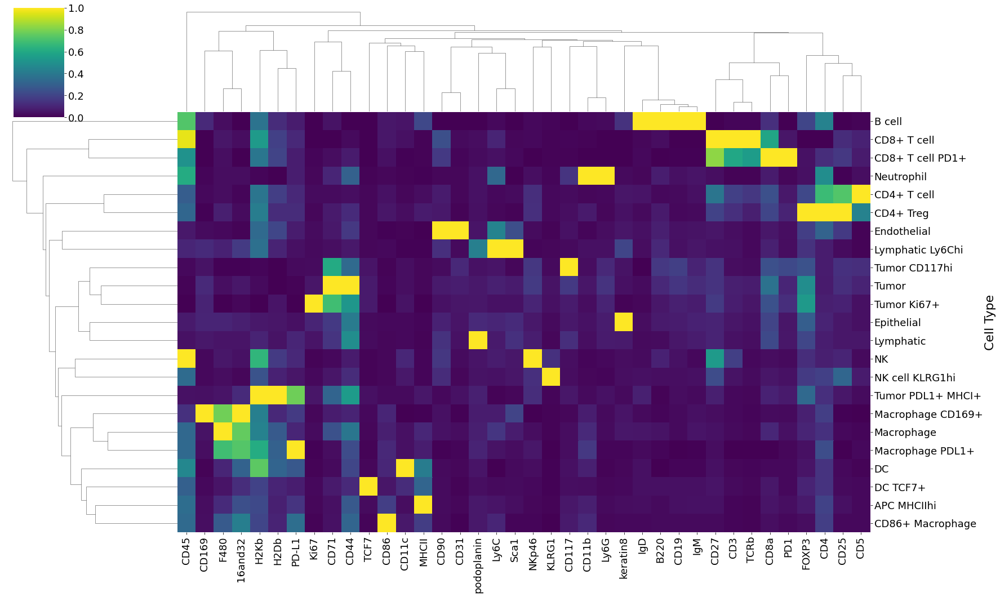

In [89]:
#Make Matrix pltot
list_col = cells.columns[1:39].to_list()
list_col.append('Cell Type')
df_sub = cells[list_col]
#df_sub_list = df_sub.loc[df_sub[cluster_col].isin(list_3)]
tt = df_sub.groupby('Cell Type').mean()
tt -= tt.min() 
tt /= tt.max()
tt.dropna(axis=0,inplace=True)

SMALL_SIZE = 18
MEDIUM_SIZE = 22
BIGGER_SIZE = 24

plt.rc('font', size=SMALL_SIZE)  # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)  # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)  # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)  # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)  # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)  # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title


sns.clustermap(tt, cmap='viridis',figsize=(25,15))

#plt.savefig(out_dir + 'B00456_cell_type_matrix_plot.png', transparent=True, format='png', bbox_inches='tight', dpi=300)


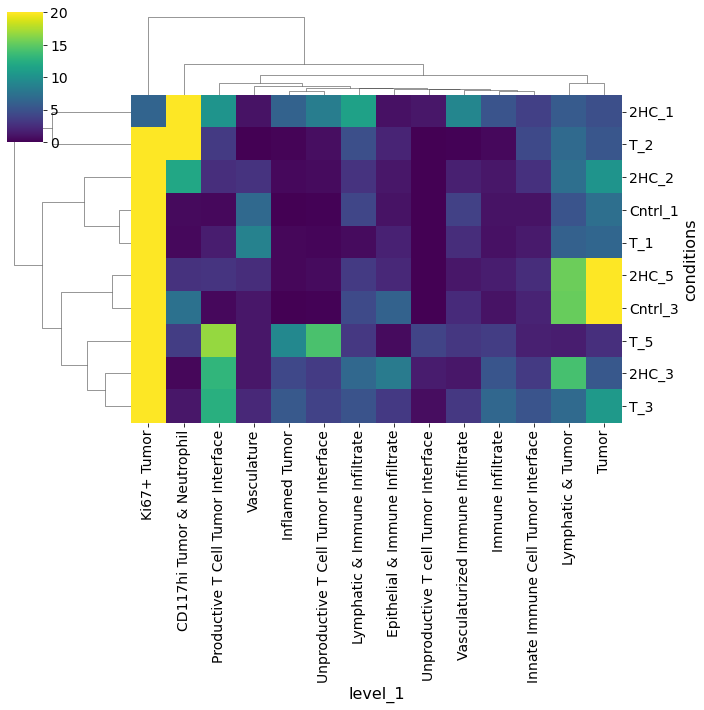

In [84]:
#leiden per sample
per_cell = cells.groupby(["conditions"]).apply(lambda x: x['neigh_name'].value_counts(normalize = True,sort = False)*100).to_frame().reset_index()
bb = per_cell.pivot(index='conditions',columns='level_1',values='neigh_name').fillna(0)
sns.clustermap(bb, cmap="viridis", vmax=20)

In [90]:
cells_out = cells.drop(columns=sum_cols)
cells_out.columns.to_list();

In [91]:
col_not = ['Unnamed: 0','cell_id',
 'first_index',
 'tile_num',
 'leiden',
 'new_clusters',
 'major_clusters',
 'leiden_0.5',
 'cell_type',
 'new_cell_type',
 'cell_type2',
 'neighborhood10',]
cell_f = cells_out.drop(columns=col_not)
cell_f

,FOXP3,CD86,CD117,Ki67,CD19,TCF7,CD3,CD90,CD25,CD11b,...,conditions,regions,cell_type3,date_reg,unique_region,date_array,Xcorr,Ycorr,neigh_name,Cell Type
0,0.316524,1.867335,0.849822,0.544836,0.589705,0.303010,0.583060,0.814131,0.534201,1.359836,...,T_1,NaN,tumor,201124reg001TNTtumors1,reg1,201124_TNTtumors1,2498.0,1344.0,Ki67+ Tumor,Tumor
1,0.233401,6.155831,1.124747,0.283782,0.320972,0.699336,0.941557,0.461406,0.234905,1.283968,...,T_1,NaN,Macrophage_CD86,201124reg001TNTtumors1,reg1,201124_TNTtumors1,2412.0,1601.0,Ki67+ Tumor,CD86+ Macrophage
2,0.430985,1.278766,0.333616,0.551252,0.387083,0.750560,0.389872,0.392532,0.369200,0.564030,...,T_1,NaN,tumor,201124reg001TNTtumors1,reg1,201124_TNTtumors1,2529.0,1256.0,Ki67+ Tumor,Tumor
3,0.452723,0.515733,0.408577,0.570919,0.373382,0.513066,0.378794,0.427219,0.351812,1.168564,...,T_1,NaN,tumor,201124reg001TNTtumors1,reg1,201124_TNTtumors1,2539.0,1302.0,Ki67+ Tumor,Tumor
4,0.467184,0.995816,0.341648,0.363062,0.355315,0.268980,0.408388,0.389336,0.316404,3.888474,...,T_1,NaN,tumor,201124reg001TNTtumors1,reg1,201124_TNTtumors1,2998.0,1268.0,Ki67+ Tumor,Tumor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355812,2.675538,0.288516,0.557381,0.500271,0.242006,1.012921,0.283793,0.276900,1.015009,0.290711,...,T_5,T_5,tumor_PDL1_MHCI,201121reg008TNTtumors2,reg50,201121_TNTtumors2,14402.0,5643.0,Inflamed Tumor,Tumor PDL1+ MHCI+
355813,2.376918,0.206922,1.494314,13.241818,0.260633,1.099111,0.483613,0.604553,1.939573,0.493126,...,T_5,T_5,tumor_Ki67,201121reg008TNTtumors2,reg50,201121_TNTtumors2,15499.0,3522.0,Ki67+ Tumor,Tumor Ki67+
355814,1.190929,0.280291,0.835948,0.782126,0.632628,0.459496,0.470898,1.779755,2.706612,0.467424,...,T_5,T_5,Endothelial,201121reg008TNTtumors2,reg50,201121_TNTtumors2,14211.0,3836.0,Vasculature,Endothelial
355815,3.873008,0.210326,0.620204,8.396317,0.258828,1.717692,0.349801,0.359541,0.962100,0.342316,...,T_5,T_5,tumor_PDL1_MHCI,201121reg008TNTtumors2,reg50,201121_TNTtumors2,15594.0,3029.0,Productive T Cell Tumor Interface,Tumor PDL1+ MHCI+


In [93]:
cell_f[['treat','day harvested']] = cell_f.conditions.apply(lambda x: pd.Series(str(x).split("_"))) 
cell_f

,FOXP3,CD86,CD117,Ki67,CD19,TCF7,CD3,CD90,CD25,CD11b,...,cell_type3,date_reg,unique_region,date_array,Xcorr,Ycorr,neigh_name,Cell Type,treat,day harvested
0,0.316524,1.867335,0.849822,0.544836,0.589705,0.303010,0.583060,0.814131,0.534201,1.359836,...,tumor,201124reg001TNTtumors1,reg1,201124_TNTtumors1,2498.0,1344.0,Ki67+ Tumor,Tumor,T,1
1,0.233401,6.155831,1.124747,0.283782,0.320972,0.699336,0.941557,0.461406,0.234905,1.283968,...,Macrophage_CD86,201124reg001TNTtumors1,reg1,201124_TNTtumors1,2412.0,1601.0,Ki67+ Tumor,CD86+ Macrophage,T,1
2,0.430985,1.278766,0.333616,0.551252,0.387083,0.750560,0.389872,0.392532,0.369200,0.564030,...,tumor,201124reg001TNTtumors1,reg1,201124_TNTtumors1,2529.0,1256.0,Ki67+ Tumor,Tumor,T,1
3,0.452723,0.515733,0.408577,0.570919,0.373382,0.513066,0.378794,0.427219,0.351812,1.168564,...,tumor,201124reg001TNTtumors1,reg1,201124_TNTtumors1,2539.0,1302.0,Ki67+ Tumor,Tumor,T,1
4,0.467184,0.995816,0.341648,0.363062,0.355315,0.268980,0.408388,0.389336,0.316404,3.888474,...,tumor,201124reg001TNTtumors1,reg1,201124_TNTtumors1,2998.0,1268.0,Ki67+ Tumor,Tumor,T,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355812,2.675538,0.288516,0.557381,0.500271,0.242006,1.012921,0.283793,0.276900,1.015009,0.290711,...,tumor_PDL1_MHCI,201121reg008TNTtumors2,reg50,201121_TNTtumors2,14402.0,5643.0,Inflamed Tumor,Tumor PDL1+ MHCI+,T,5
355813,2.376918,0.206922,1.494314,13.241818,0.260633,1.099111,0.483613,0.604553,1.939573,0.493126,...,tumor_Ki67,201121reg008TNTtumors2,reg50,201121_TNTtumors2,15499.0,3522.0,Ki67+ Tumor,Tumor Ki67+,T,5
355814,1.190929,0.280291,0.835948,0.782126,0.632628,0.459496,0.470898,1.779755,2.706612,0.467424,...,Endothelial,201121reg008TNTtumors2,reg50,201121_TNTtumors2,14211.0,3836.0,Vasculature,Endothelial,T,5
355815,3.873008,0.210326,0.620204,8.396317,0.258828,1.717692,0.349801,0.359541,0.962100,0.342316,...,tumor_PDL1_MHCI,201121reg008TNTtumors2,reg50,201121_TNTtumors2,15594.0,3029.0,Productive T Cell Tumor Interface,Tumor PDL1+ MHCI+,T,5


In [94]:
cell_f.treat.unique()

array(['T', 'Cntrl', '2HC'], dtype=object)

In [97]:
n_conversion_t = {
'T':'T cells',
'Cntrl':'No T cells',
'2HC':'2HC T cells'
}
cell_f['treatment']=cell_f['treat'].map(n_conversion_t)
cell_f.treatment.unique()

array(['T cells', 'No T cells', '2HC T cells'], dtype=object)

In [98]:
cell_f['day harvested'].unique()

array(['1', '2', '3', '5'], dtype=object)

In [99]:
save_path

'G:/21_11_24_Mouse_Temporary/20_11/Processed_and_analyzed/'

In [101]:
cell_f.to_csv(save_path+'20_11_Neighborhoods_all.csv')

In [ ]:
# for n,f in enumerate(figs_c):
#     f.savefig(save_path+str(k)+'08_tumors_{}.png'.format(n), dpi=600)

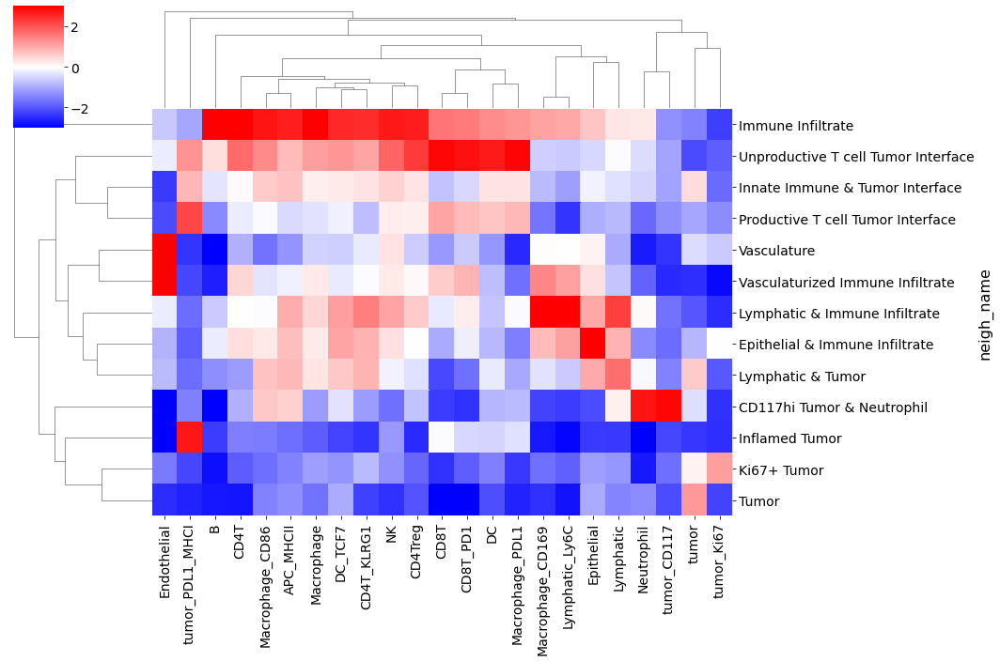

In [75]:
#this plot shows the types of cells (ClusterIDs) in the different niches (0-9)
#font size of graph
SMALL_SIZE = 14
MEDIUM_SIZE = 16
BIGGER_SIZE = 18

#Settings for graph
plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

#Find cell frequency within the neighborhoods
cell_list = list(sum_cols)
cell_list.append('neigh_name')
cells[sum_cols]
subset = cells[cell_list]
niche_sub = subset.groupby('neigh_name').sum()
niche_df = niche_sub.apply(lambda x: x/x.sum() * 10, axis=1)
neigh_clusters = niche_df.to_numpy()

tissue_avgs = values.mean(axis = 0)
fc_2 = np.log2(((neigh_clusters+tissue_avgs)/(neigh_clusters+tissue_avgs).sum(axis = 1, keepdims = True))/tissue_avgs)
fc_2 = pd.DataFrame(fc_2,columns = sum_cols)
fc_2.set_index(niche_df.index, inplace=True)
s=sns.clustermap(fc_2, vmin =-3,vmax = 3,cmap = 'bwr', figsize=(15,10))
# s.savefig(save_path+"celltypes_perniche_merged_neighborhood_30.png", dpi=600)
# print(save_path)

#########################